# Problem Statement: 
- Build an underwriting layer to determine the creditworthiness of MSMEs as well as individuals.
- Given a set of attributes for an Individual, determine if a credit line should be extended to them. 
- If so, what should the repayment terms be in business recommendations?


In [1]:
import profile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import statistics
from warnings import filterwarnings
from statsmodels.stats import weightstats
import statsmodels.api as sm
from scipy import stats
from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from pandas_profiling import ProfileReport
from sklearn.linear_model import LogisticRegression
from collections import Counter
filterwarnings('ignore')
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.impute import KNNImputer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, 
    roc_auc_score, roc_curve, auc,
    plot_confusion_matrix, plot_roc_curve
)
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE

In [692]:
data = pd.read_csv('logistic_regression.csv')
data

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396025,10000.0,60 months,10.99,217.38,B,B4,licensed bankere,2 years,RENT,40000.0,...,6.0,0.0,1990.0,34.3,23.0,w,INDIVIDUAL,0.0,0.0,"12951 Williams Crossing\r\nJohnnyville, DC 30723"
396026,21000.0,36 months,12.29,700.42,C,C1,Agent,5 years,MORTGAGE,110000.0,...,6.0,0.0,43263.0,95.7,8.0,f,INDIVIDUAL,1.0,0.0,"0114 Fowler Field Suite 028\r\nRachelborough, ..."
396027,5000.0,36 months,9.99,161.32,B,B1,City Carrier,10+ years,RENT,56500.0,...,15.0,0.0,32704.0,66.9,23.0,f,INDIVIDUAL,0.0,0.0,"953 Matthew Points Suite 414\r\nReedfort, NY 7..."
396028,21000.0,60 months,15.31,503.02,C,C2,"Gracon Services, Inc",10+ years,MORTGAGE,64000.0,...,9.0,0.0,15704.0,53.8,20.0,f,INDIVIDUAL,5.0,0.0,"7843 Blake Freeway Apt. 229\r\nNew Michael, FL..."


In [693]:
profile = ProfileReport(data, title="Spaceship Profiling Report")
profile.to_file(output_file= 'output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [694]:
profile.to_notebook_iframe()

In [695]:
data.shape

(396030, 27)

In [696]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

## Simple Feature Engineering steps
### Creation of Flags

In [697]:
# creating flag on ['pub_rec','mort_acc','pub_rec_bankruptcies']
flag_columns = ['pub_rec','mort_acc','pub_rec_bankruptcies']
for col in flag_columns:
    data[col] = np.where(data[col] >1.0, 1, 0)

In [698]:
data[flag_columns]

,pub_rec,mort_acc,pub_rec_bankruptcies
0,0,0,0
1,0,1,0
2,0,0,0
3,0,0,0
4,0,0,0
...,...,...,...
396025,0,0,0
396026,0,0,0
396027,0,0,0
396028,0,1,0


In [699]:
category_columns = ['term', 'grade','sub_grade','emp_length','home_ownership','verification_status','loan_status',
'purpose','pub_rec','initial_list_status','application_type','mort_acc','pub_rec_bankruptcies']
numerical_columns = ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti','open_acc','revol_bal','revol_util'
,'total_acc']
object_columns = ['emp_title','title','address']
date_columns = ['issue_d','earliest_cr_line']
for col in category_columns:
    print(col, data[col].unique())

term [' 36 months' ' 60 months']
grade ['B' 'A' 'C' 'E' 'D' 'F' 'G']
sub_grade ['B4' 'B5' 'B3' 'A2' 'C5' 'C3' 'A1' 'B2' 'C1' 'A5' 'E4' 'A4' 'A3' 'D1'
 'C2' 'B1' 'D3' 'D5' 'D2' 'E1' 'E2' 'E5' 'F4' 'E3' 'D4' 'G1' 'F5' 'G2'
 'C4' 'F1' 'F3' 'G5' 'G4' 'F2' 'G3']
emp_length ['10+ years' '4 years' '< 1 year' '6 years' '9 years' '2 years' '3 years'
 '8 years' '7 years' '5 years' '1 year' nan]
home_ownership ['RENT' 'MORTGAGE' 'OWN' 'OTHER' 'NONE' 'ANY']
verification_status ['Not Verified' 'Source Verified' 'Verified']
loan_status ['Fully Paid' 'Charged Off']
purpose ['vacation' 'debt_consolidation' 'credit_card' 'home_improvement'
 'small_business' 'major_purchase' 'other' 'medical' 'wedding' 'car'
 'moving' 'house' 'educational' 'renewable_energy']
pub_rec [0 1]
initial_list_status ['w' 'f']
application_type ['INDIVIDUAL' 'JOINT' 'DIRECT_PAY']
mort_acc [0 1]
pub_rec_bankruptcies [0 1]


In [700]:
# Converting categorical column into category
data[category_columns] = data[category_columns].astype('category')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   loan_amnt             396030 non-null  float64 
 1   term                  396030 non-null  category
 2   int_rate              396030 non-null  float64 
 3   installment           396030 non-null  float64 
 4   grade                 396030 non-null  category
 5   sub_grade             396030 non-null  category
 6   emp_title             373103 non-null  object  
 7   emp_length            377729 non-null  category
 8   home_ownership        396030 non-null  category
 9   annual_inc            396030 non-null  float64 
 10  verification_status   396030 non-null  category
 11  issue_d               396030 non-null  object  
 12  loan_status           396030 non-null  category
 13  purpose               396030 non-null  category
 14  title                 394275 non-nul

In [701]:
for col in date_columns:
    data[col] = pd.to_datetime(data[col])
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             396030 non-null  float64       
 1   term                  396030 non-null  category      
 2   int_rate              396030 non-null  float64       
 3   installment           396030 non-null  float64       
 4   grade                 396030 non-null  category      
 5   sub_grade             396030 non-null  category      
 6   emp_title             373103 non-null  object        
 7   emp_length            377729 non-null  category      
 8   home_ownership        396030 non-null  category      
 9   annual_inc            396030 non-null  float64       
 10  verification_status   396030 non-null  category      
 11  issue_d               396030 non-null  datetime64[ns]
 12  loan_status           396030 non-null  category      
 13 

In [702]:
data[date_columns]

,issue_d,earliest_cr_line
0,2015-01-01,1990-06-01
1,2015-01-01,2004-07-01
2,2015-01-01,2007-08-01
3,2014-11-01,2006-09-01
4,2013-04-01,1999-03-01
...,...,...
396025,2015-10-01,2004-11-01
396026,2015-02-01,2006-02-01
396027,2013-10-01,1997-03-01
396028,2012-08-01,1990-11-01


In [703]:
data.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,revol_bal,revol_util,total_acc
count,396030.000000,396030.000000,396030.000000,3.960300e+05,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000
mean,14113.888089,13.639400,431.849698,7.420318e+04,17.379514,11.311153,1.584454e+04,53.791749,25.414744
std,8357.441341,4.472157,250.727790,6.163762e+04,18.019092,5.137649,2.059184e+04,24.452193,11.886991
min,500.000000,5.320000,16.080000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,2.000000
25%,8000.000000,10.490000,250.330000,4.500000e+04,11.280000,8.000000,6.025000e+03,35.800000,17.000000
50%,12000.000000,13.330000,375.430000,6.400000e+04,16.910000,10.000000,1.118100e+04,54.800000,24.000000
75%,20000.000000,16.490000,567.300000,9.000000e+04,22.980000,14.000000,1.962000e+04,72.900000,32.000000
max,40000.000000,30.990000,1533.810000,8.706582e+06,9999.000000,90.000000,1.743266e+06,892.300000,151.000000


In [704]:
data.describe(include = 'all')

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
count,396030.000000,396030,396030.000000,396030.000000,396030,396030,373103,377729,396030,3.960300e+05,...,396030.000000,396030.0,3.960300e+05,395754.000000,396030.000000,396030,396030,396030.0,396030.0,396030
unique,NaN,2,NaN,NaN,7,35,173105,11,6,NaN,...,NaN,2.0,NaN,NaN,NaN,2,3,2.0,2.0,393700
top,NaN,36 months,NaN,NaN,B,B3,Teacher,10+ years,MORTGAGE,NaN,...,NaN,0.0,NaN,NaN,NaN,f,INDIVIDUAL,0.0,0.0,USCGC Smith\r\nFPO AE 70466
freq,NaN,302005,NaN,NaN,116018,26655,4389,126041,198348,NaN,...,NaN,388011.0,NaN,NaN,NaN,238066,395319,237988.0,393705.0,8
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,14113.888089,NaN,13.639400,431.849698,NaN,NaN,NaN,NaN,NaN,7.420318e+04,...,11.311153,NaN,1.584454e+04,53.791749,25.414744,NaN,NaN,NaN,NaN,NaN
std,8357.441341,NaN,4.472157,250.727790,NaN,NaN,NaN,NaN,NaN,6.163762e+04,...,5.137649,NaN,2.059184e+04,24.452193,11.886991,NaN,NaN,NaN,NaN,NaN
min,500.000000,NaN,5.320000,16.080000,NaN,NaN,NaN,NaN,NaN,0.000000e+00,...,0.000000,NaN,0.000000e+00,0.000000,2.000000,NaN,NaN,NaN,NaN,NaN
25%,8000.000000,NaN,10.490000,250.330000,NaN,NaN,NaN,NaN,NaN,4.500000e+04,...,8.000000,NaN,6.025000e+03,35.800000,17.000000,NaN,NaN,NaN,NaN,NaN


In [705]:
data.describe(include='category')

,term,grade,sub_grade,emp_length,home_ownership,verification_status,loan_status,purpose,pub_rec,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies
count,396030,396030,396030,377729,396030,396030,396030,396030,396030,396030,396030,396030,396030
unique,2,7,35,11,6,3,2,14,2,2,3,2,2
top,36 months,B,B3,10+ years,MORTGAGE,Verified,Fully Paid,debt_consolidation,0,f,INDIVIDUAL,0,0
freq,302005,116018,26655,126041,198348,139563,318357,234507,388011,238066,395319,237988,393705


In [706]:
data.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                    0
pub_rec_bankruptcies        0
address                     0
dtype: int64

In [707]:
np.round(data.isnull().sum()/len(data)*100,2)

loan_amnt               0.00
term                    0.00
int_rate                0.00
installment             0.00
grade                   0.00
sub_grade               0.00
emp_title               5.79
emp_length              4.62
home_ownership          0.00
annual_inc              0.00
verification_status     0.00
issue_d                 0.00
loan_status             0.00
purpose                 0.00
title                   0.44
dti                     0.00
earliest_cr_line        0.00
open_acc                0.00
pub_rec                 0.00
revol_bal               0.00
revol_util              0.07
total_acc               0.00
initial_list_status     0.00
application_type        0.00
mort_acc                0.00
pub_rec_bankruptcies    0.00
address                 0.00
dtype: float64

In [708]:
for col in category_columns:
    print(col,":")
    print( data[col].value_counts())

term :
 36 months    302005
 60 months     94025
Name: term, dtype: int64
grade :
B    116018
C    105987
A     64187
D     63524
E     31488
F     11772
G      3054
Name: grade, dtype: int64
sub_grade :
B3    26655
B4    25601
C1    23662
C2    22580
B2    22495
B5    22085
C3    21221
C4    20280
B1    19182
A5    18526
C5    18244
D1    15993
A4    15789
D2    13951
D3    12223
D4    11657
A3    10576
A1     9729
D5     9700
A2     9567
E1     7917
E2     7431
E3     6207
E4     5361
E5     4572
F1     3536
F2     2766
F3     2286
F4     1787
F5     1397
G1     1058
G2      754
G3      552
G4      374
G5      316
Name: sub_grade, dtype: int64
emp_length :
10+ years    126041
2 years       35827
< 1 year      31725
3 years       31665
5 years       26495
1 year        25882
4 years       23952
6 years       20841
7 years       20819
8 years       19168
9 years       15314
Name: emp_length, dtype: int64
home_ownership :
MORTGAGE    198348
RENT        159790
OWN          37746
OTHER   

In [709]:
for col in category_columns:
    print(col,":")
    print( data[col].value_counts(normalize=True)*100)

term :
 36 months    76.258112
 60 months    23.741888
Name: term, dtype: float64
grade :
B    29.295255
C    26.762366
A    16.207611
D    16.040199
E     7.950913
F     2.972502
G     0.771154
Name: grade, dtype: float64
sub_grade :
B3    6.730551
B4    6.464409
C1    5.974800
C2    5.701588
B2    5.680125
B5    5.576598
C3    5.358432
C4    5.120824
B1    4.843572
A5    4.677928
C5    4.606722
D1    4.038330
A4    3.986819
D2    3.522713
D3    3.086382
D4    2.943464
A3    2.670505
A1    2.456632
D5    2.449309
A2    2.415726
E1    1.999091
E2    1.876373
E3    1.567306
E4    1.353685
E5    1.154458
F1    0.892862
F2    0.698432
F3    0.577229
F4    0.451228
F5    0.352751
G1    0.267151
G2    0.190390
G3    0.139383
G4    0.094437
G5    0.079792
Name: sub_grade, dtype: float64
emp_length :
10+ years    33.368103
2 years       9.484842
< 1 year      8.398879
3 years       8.382994
5 years       7.014288
1 year        6.852002
4 years       6.341054
6 years       5.517448
7 years    

In [710]:
data[category_columns].nunique()

term                     2
grade                    7
sub_grade               35
emp_length              11
home_ownership           6
verification_status      3
loan_status              2
purpose                 14
pub_rec                  2
initial_list_status      2
application_type         3
mort_acc                 2
pub_rec_bankruptcies     2
dtype: int64

In [711]:
# Dropping the duplicate columns
data.drop_duplicates()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16.0,0,36369.0,41.8,25.0,w,INDIVIDUAL,0,0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17.0,0,20131.0,53.3,27.0,f,INDIVIDUAL,1,0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13.0,0,11987.0,92.2,26.0,f,INDIVIDUAL,0,0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6.0,0,5472.0,21.5,13.0,f,INDIVIDUAL,0,0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13.0,0,24584.0,69.8,43.0,f,INDIVIDUAL,0,0,"679 Luna Roads\r\nGreggshire, VA 11650"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396025,10000.0,60 months,10.99,217.38,B,B4,licensed bankere,2 years,RENT,40000.0,...,6.0,0,1990.0,34.3,23.0,w,INDIVIDUAL,0,0,"12951 Williams Crossing\r\nJohnnyville, DC 30723"
396026,21000.0,36 months,12.29,700.42,C,C1,Agent,5 years,MORTGAGE,110000.0,...,6.0,0,43263.0,95.7,8.0,f,INDIVIDUAL,0,0,"0114 Fowler Field Suite 028\r\nRachelborough, ..."
396027,5000.0,36 months,9.99,161.32,B,B1,City Carrier,10+ years,RENT,56500.0,...,15.0,0,32704.0,66.9,23.0,f,INDIVIDUAL,0,0,"953 Matthew Points Suite 414\r\nReedfort, NY 7..."
396028,21000.0,60 months,15.31,503.02,C,C2,"Gracon Services, Inc",10+ years,MORTGAGE,64000.0,...,9.0,0,15704.0,53.8,20.0,f,INDIVIDUAL,1,0,"7843 Blake Freeway Apt. 229\r\nNew Michael, FL..."



### Univariate Analysis

Lets check the distributions of these features one by one

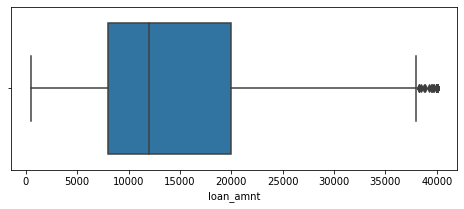

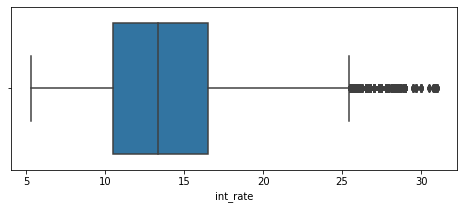

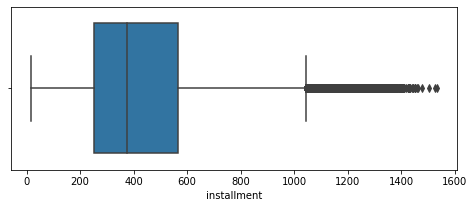

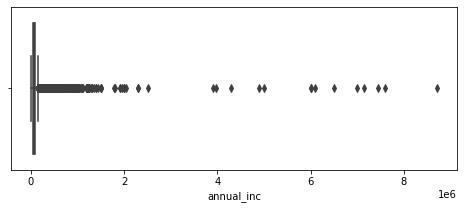

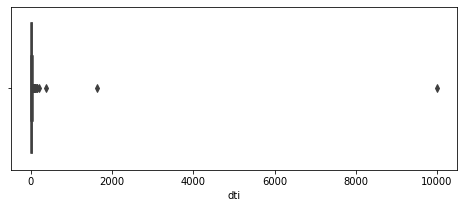

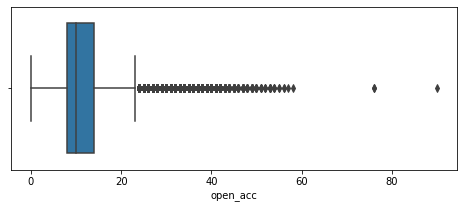

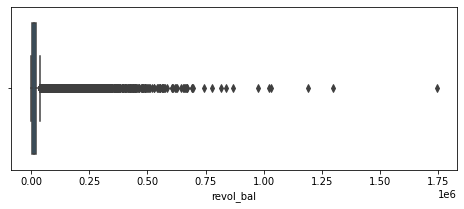

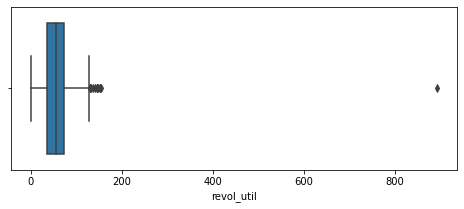

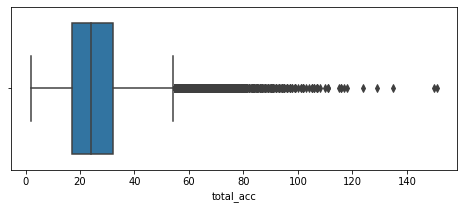

In [712]:

for j in numerical_columns:
    plt.figure(figsize= (8,3))

    sns.boxplot(data[j])

plt.show()

Dataset contain no outliers expect in LOR

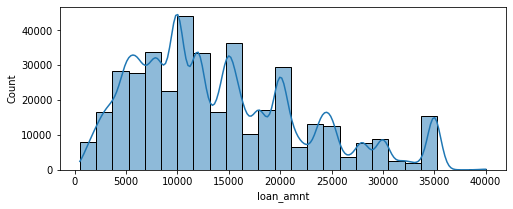

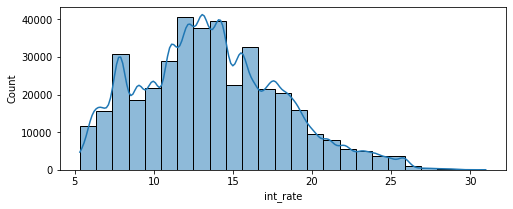

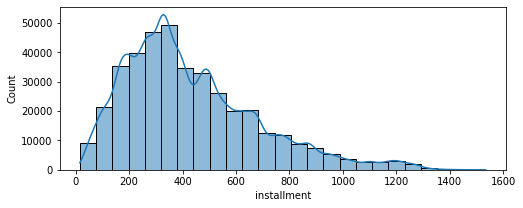

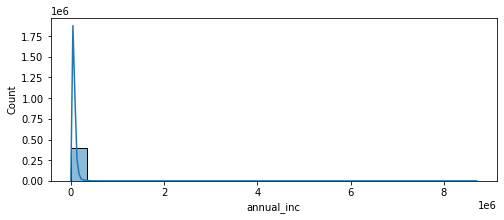

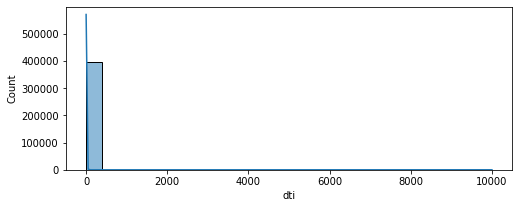

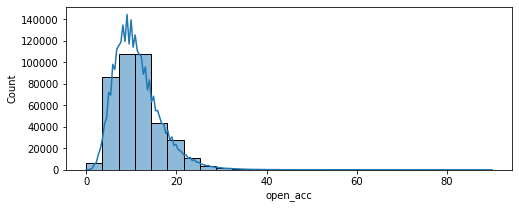

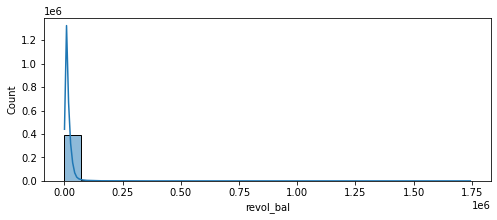

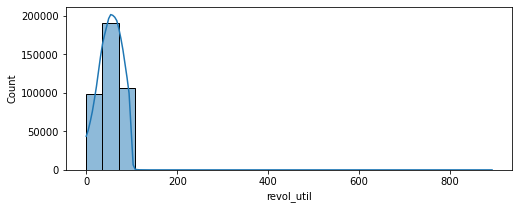

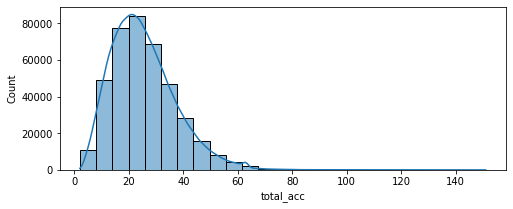

In [713]:
for j in numerical_columns:
    plt.figure(figsize= (8,3))

    sns.histplot(data[j], kde=True, bins=25)

plt.show()

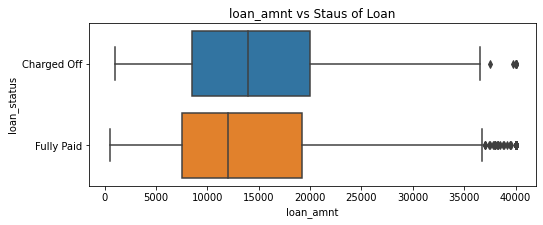

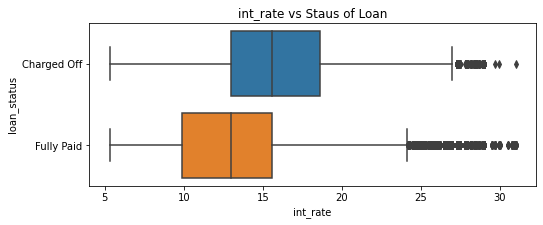

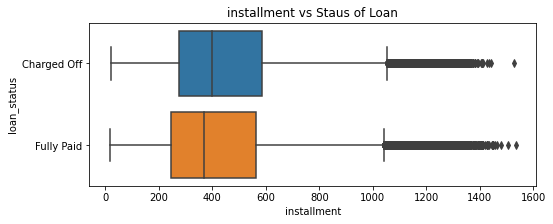

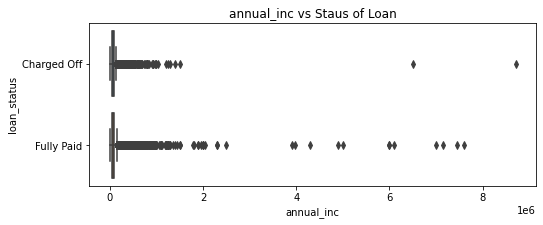

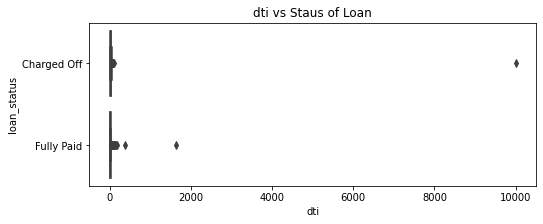

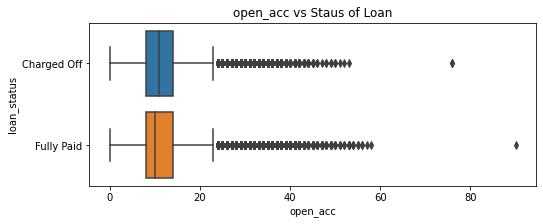

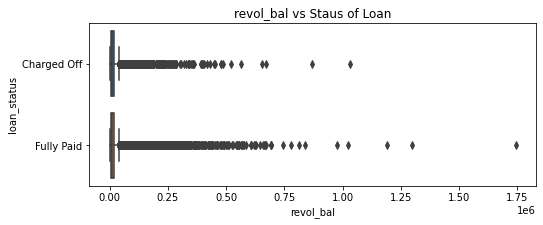

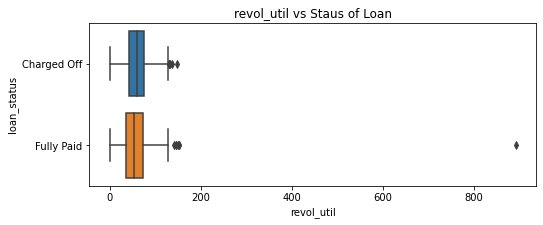

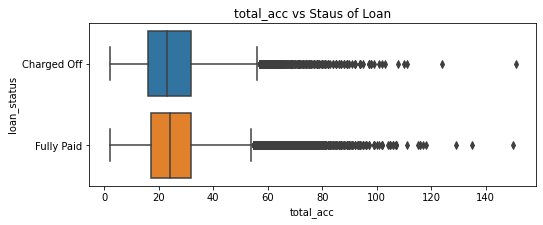

In [714]:
for col in numerical_columns:
    plt.figure(figsize=(8,3))
    sns.boxplot(y = 'loan_status',x=col, data=data)
    plt.title(col +' vs Staus of Loan')
    plt.show()

### Correlation
Now lets look at the correlations of numerical features with each other

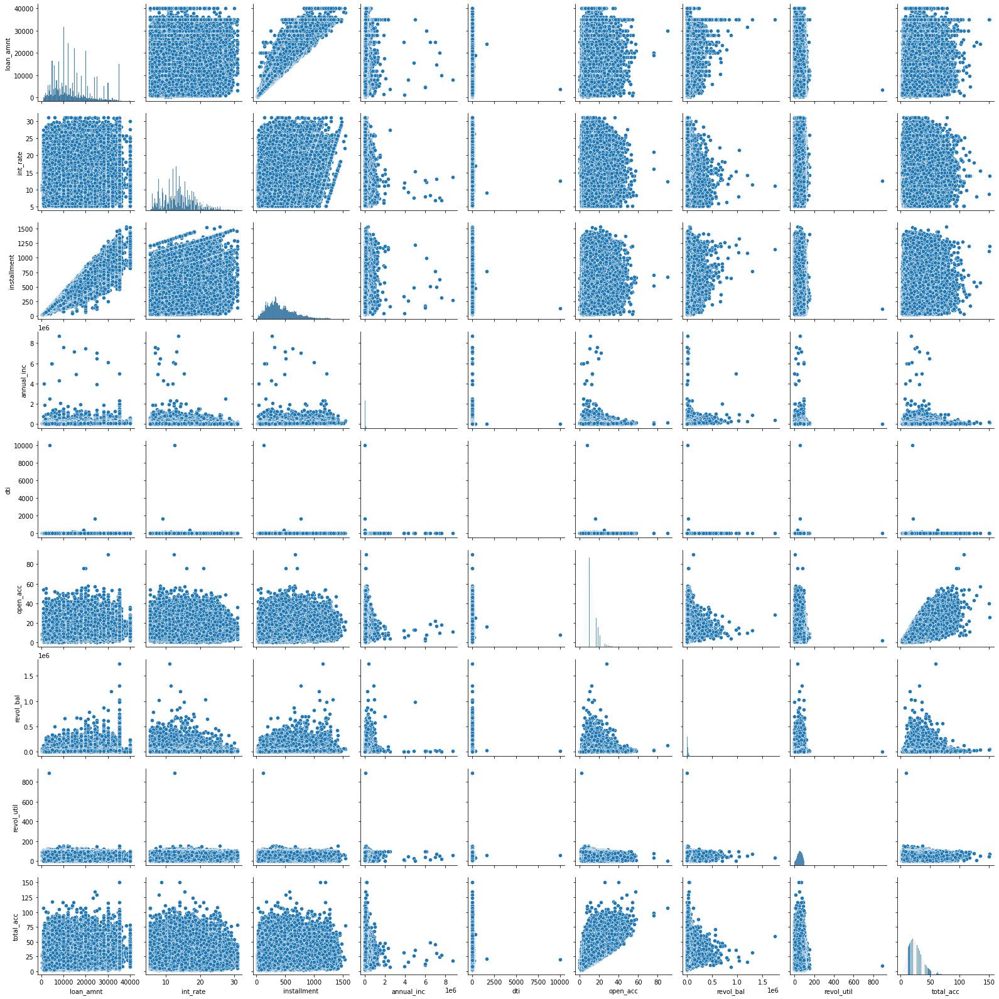

In [715]:
sns.pairplot(data=data)
plt.show()

Chance of Admit is highly correlated with GRE Score, TOEFL Score and CGPA.

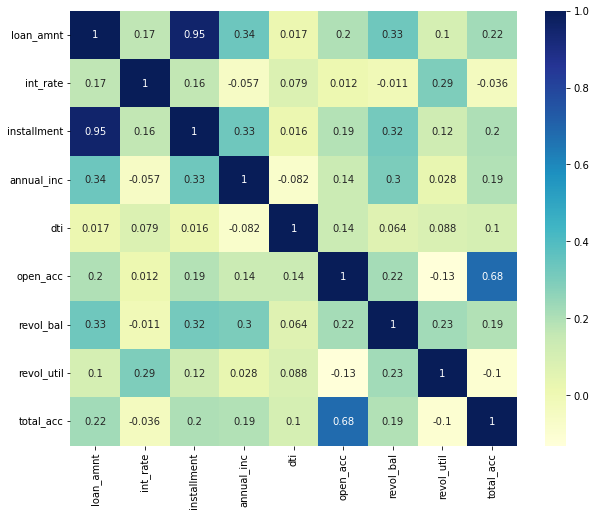

In [716]:
plt.figure(figsize=(10,8))
ax = sns.heatmap(data.corr(), cmap="YlGnBu", annot=True)

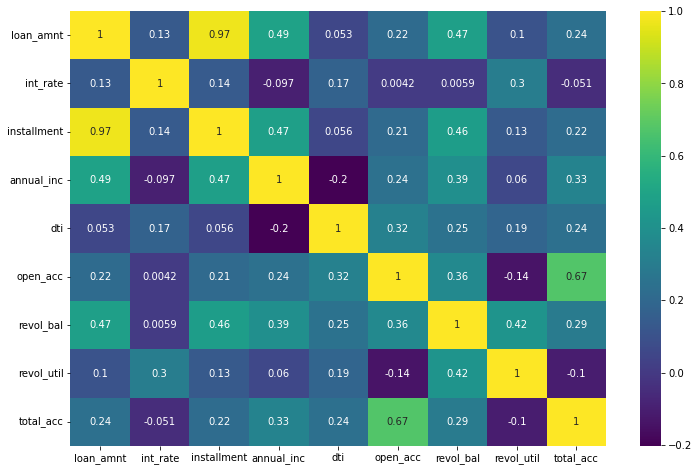

In [717]:
plt.figure(figsize=(12, 8))
sns.heatmap(data.corr(method='spearman'), annot=True, cmap='viridis')
plt.show()

We noticed almost perfect correlation between "loan_amnt" the "installment" feature.
- installment: The monthly payment owed by the borrower if the loan originates.
- loan_amnt: The listed amount of the loan applied for by the borrower. If at some point in time, the credit
department reduces the loan amount, then it will be reﬂected in this value.
So, we can drop either one of those columns.

In [718]:
# data.drop(columns=['installment'], axis=1, inplace=True)

In [719]:
data['loan_status'].value_counts()

Fully Paid     318357
Charged Off     77673
Name: loan_status, dtype: int64

The no of people those who have fully paid are 318357 and that of Charged Oﬀ are 77673.

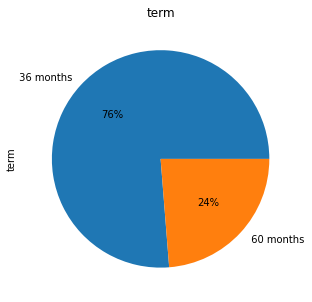

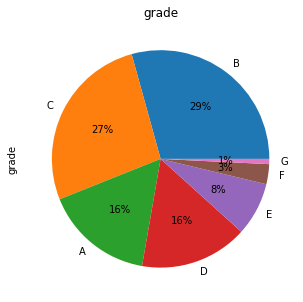

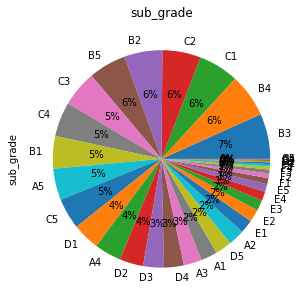

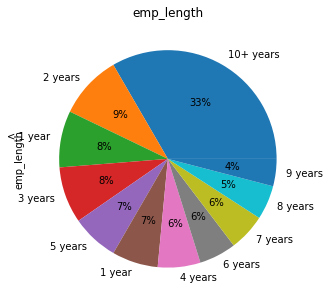

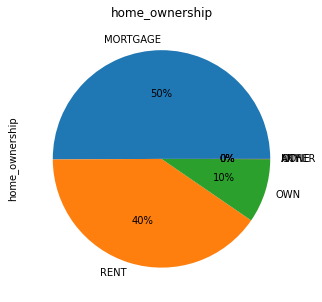

...

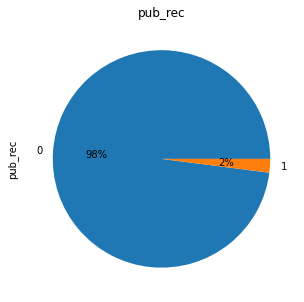

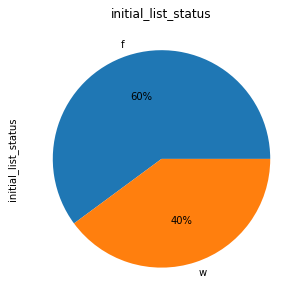

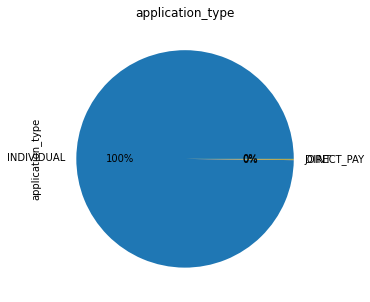

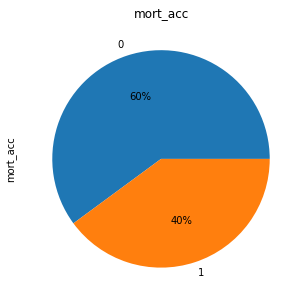

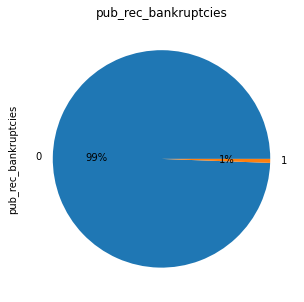

In [720]:
for col in category_columns:
    plt.figure(figsize=(8,3))
    data[col].value_counts().plot(kind= 'pie', figsize=(8,5), autopct= '%1.0f%%')
    plt.xticks(rotation = 90)
    plt.title(col)
    plt.show()

- 80% of customers have fully paid their Loan Amount
- 60% of customers have mortgage account

In [780]:
data['home_ownership'].value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: home_ownership, dtype: int64

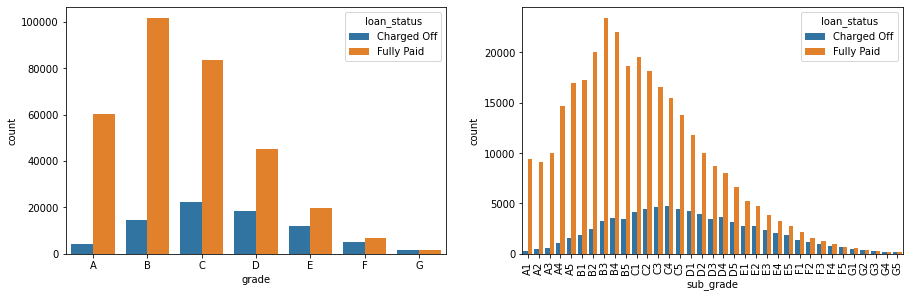

In [721]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(data.grade.unique().tolist())
sns.countplot(x='grade', data=data, hue='loan_status', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(data.sub_grade.unique().tolist())
g = sns.countplot(x='sub_grade', data=data, hue='loan_status', order=sub_grade)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

The grade of majority of people those who have fully paid the loan is 'B' and have subgrade 'B3'.
So from where we can infer that people with grade 'B' and subgrade 'B3' are more likely to fully pay the loan.

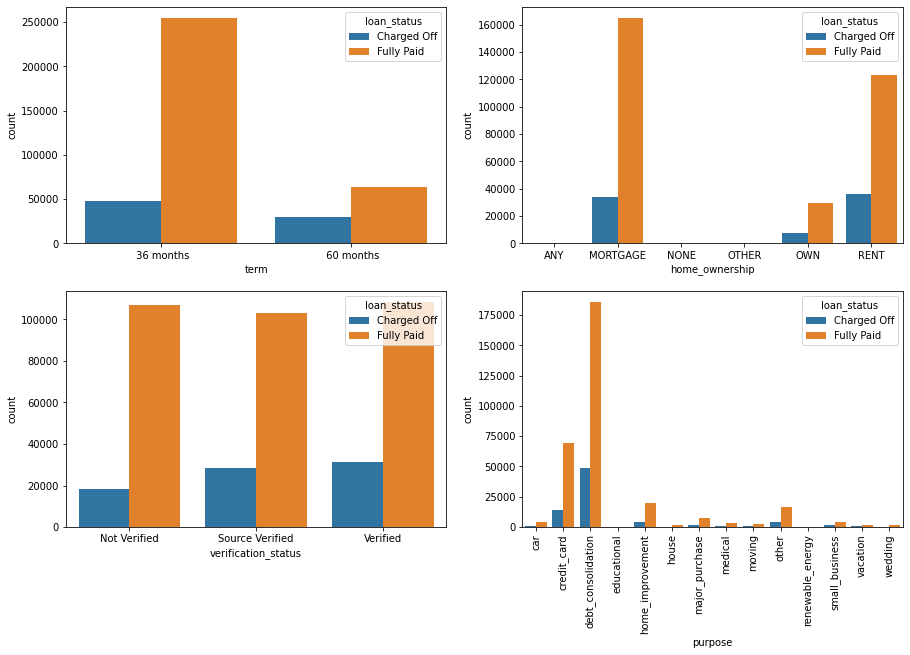

In [722]:
plt.figure(figsize=(15, 20))

plt.subplot(4, 2, 1)
sns.countplot(x='term', data=data, hue='loan_status')

plt.subplot(4, 2, 2)
sns.countplot(x='home_ownership', data=data, hue='loan_status')

plt.subplot(4, 2, 3)
sns.countplot(x='verification_status', data=data, hue='loan_status')

plt.subplot(4, 2, 4)
g = sns.countplot(x='purpose', data=data, hue='loan_status')
g.set_xticklabels(g.get_xticklabels(), rotation=90);

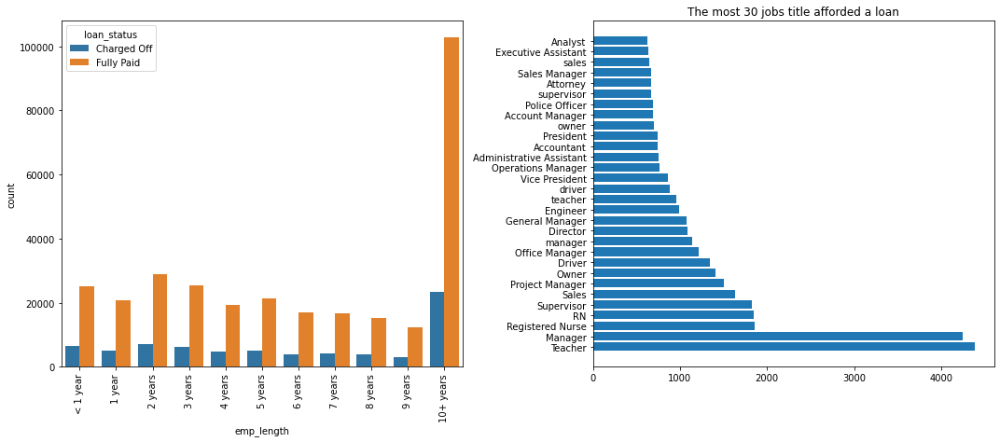

In [723]:
plt.figure(figsize=(15, 12))

plt.subplot(2, 2, 1)
order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', 
          '6 years', '7 years', '8 years', '9 years', '10+ years',]
g = sns.countplot(x='emp_length', data=data, hue='loan_status', order=order)
g.set_xticklabels(g.get_xticklabels(), rotation=90);

plt.subplot(2, 2, 2)
plt.barh(data.emp_title.value_counts()[:30].index, data.emp_title.value_counts()[:30])
plt.title("The most 30 jobs title afforded a loan")
plt.tight_layout()

Manager and Teacher are the most aﬀorded loan job titles.

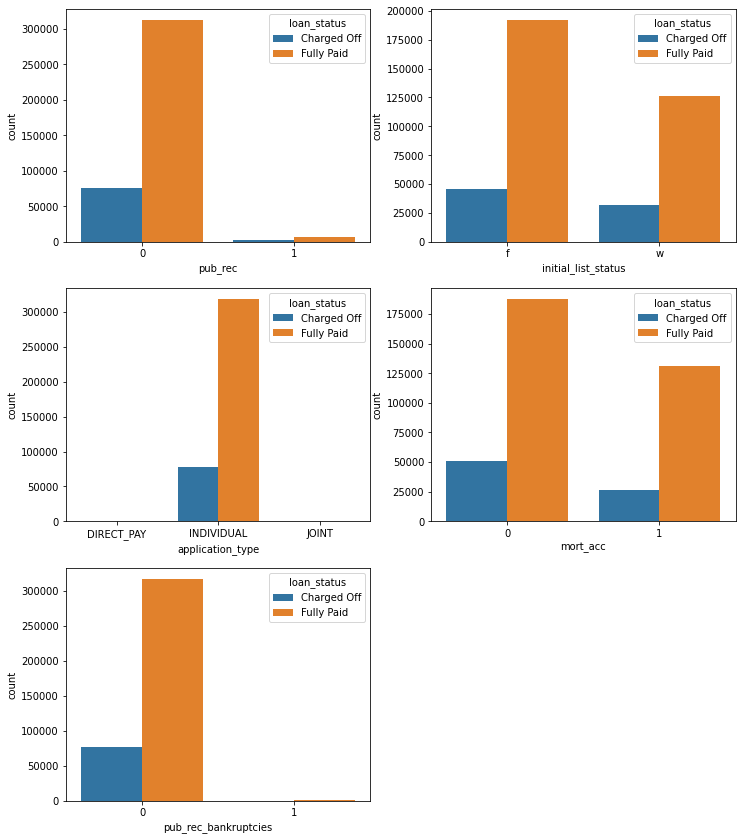

In [724]:
plt.figure(figsize=(12, 30))

plt.subplot(6, 2, 1)
sns.countplot(x='pub_rec', data=data, hue='loan_status')

plt.subplot(6, 2, 2)
sns.countplot(x='initial_list_status', data=data, hue='loan_status')

plt.subplot(6, 2, 3)
sns.countplot(x='application_type', data=data, hue='loan_status')

plt.subplot(6, 2, 4)
sns.countplot(x='mort_acc', data=data, hue='loan_status')

plt.subplot(6, 2, 5)
sns.countplot(x='pub_rec_bankruptcies', data=data, hue='loan_status')

plt.show()

In [725]:
# Mapping of target variable -
data['loan_status'] = data.loan_status.map({'Fully Paid':0, 'Charged Off':1})

In [726]:
data.groupby(by='loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
1,77673.0,15126.300967,8505.090557,1000.0,8525.0,14000.0,20000.0,40000.0
0,318357.0,13866.878771,8302.319699,500.0,7500.0,12000.0,19225.0,40000.0


In [727]:
data['home_ownership'].value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: home_ownership, dtype: int64

The majority of people have home ownership as Mortgage and Rent.


In [728]:
data['title'].value_counts()[:20]

Debt consolidation           152472
Credit card refinancing       51487
Home improvement              15264
Other                         12930
Debt Consolidation            11608
Major purchase                 4769
Consolidation                  3852
debt consolidation             3547
Business                       2949
Debt Consolidation Loan        2864
Medical expenses               2742
Car financing                  2139
Credit Card Consolidation      1775
Vacation                       1717
Moving and relocation          1689
consolidation                  1595
Personal Loan                  1591
Consolidation Loan             1299
Home Improvement               1268
Home buying                    1183
Name: title, dtype: int64

In [729]:
data['title'] = data.title.str.lower()

In [730]:
data.title.value_counts()[:10]

debt consolidation           168108
credit card refinancing       51781
home improvement              17117
other                         12993
consolidation                  5583
major purchase                 4998
debt consolidation loan        3513
business                       3017
medical expenses               2820
credit card consolidation      2638
Name: title, dtype: int64


## Missing value treatment

In [731]:
data.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                    0
pub_rec_bankruptcies        0
address                     0
dtype: int64

In [732]:
impute = KNNImputer(n_neighbors=5)

data['revol_util'] = impute.fit_transform(data[['revol_util']])
data.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                  0
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                    0
pub_rec_bankruptcies        0
address                     0
dtype: int64

In [733]:
statistics.mode(data['emp_length'])

'10+ years'

In [734]:
data['emp_title'] = data['emp_title'].fillna('unknown emp_title')
data['emp_length'] = data['emp_length'].fillna(statistics.mode(data['emp_length']))
data['title'] = data['title'].fillna('unknown title')
data.isnull().sum()

loan_amnt               0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
title                   0
dti                     0
earliest_cr_line        0
open_acc                0
pub_rec                 0
revol_bal               0
revol_util              0
total_acc               0
initial_list_status     0
application_type        0
mort_acc                0
pub_rec_bankruptcies    0
address                 0
dtype: int64

In [735]:
# Extracting the zip code from address.
data['zipcode'] = data['address'].apply(lambda x: x[-5:])
data = data.drop(['address'], axis= 1)
data

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,zipcode
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16.0,0,36369.0,41.8,25.0,w,INDIVIDUAL,0,0,22690
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17.0,0,20131.0,53.3,27.0,f,INDIVIDUAL,1,0,05113
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13.0,0,11987.0,92.2,26.0,f,INDIVIDUAL,0,0,05113
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6.0,0,5472.0,21.5,13.0,f,INDIVIDUAL,0,0,00813
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13.0,0,24584.0,69.8,43.0,f,INDIVIDUAL,0,0,11650
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396025,10000.0,60 months,10.99,217.38,B,B4,licensed bankere,2 years,RENT,40000.0,...,6.0,0,1990.0,34.3,23.0,w,INDIVIDUAL,0,0,30723
396026,21000.0,36 months,12.29,700.42,C,C1,Agent,5 years,MORTGAGE,110000.0,...,6.0,0,43263.0,95.7,8.0,f,INDIVIDUAL,0,0,05113
396027,5000.0,36 months,9.99,161.32,B,B1,City Carrier,10+ years,RENT,56500.0,...,15.0,0,32704.0,66.9,23.0,f,INDIVIDUAL,0,0,70466
396028,21000.0,60 months,15.31,503.02,C,C2,"Gracon Services, Inc",10+ years,MORTGAGE,64000.0,...,9.0,0,15704.0,53.8,20.0,f,INDIVIDUAL,1,0,29597


In [736]:
data['issue_d'] = data['issue_d'].dt.year
data['earliest_cr_line'] = data['earliest_cr_line'].dt.year

# Outlier treatment

In [737]:
df = data.copy()
for i,j in enumerate(numerical_columns):
    q1=df[j].quantile(0.25)
    q3=df[j].quantile(0.75)
    iqr=q3-q1

    df=df[(df[j]>=q1-1.5*iqr)&(df[j]<=q3+1.5*iqr)]

In [738]:
df.shape

(334720, 27)

In [739]:
data.shape[0]

396030

In [740]:
# % of data removed as outlier
((data.shape[0]- df.shape[0]) / data.shape[0])*100

15.481150417897634

15.48% of data has been removed as outliers.

### Data preparation for modeling

In [741]:
list_status = {'w': 0, 'f': 1}
data['initial_list_status'] = data.initial_list_status.map(list_status)

In [742]:
df['term'] = df['term'].str.replace('36 months', '36')
df['term'] = df['term'].str.replace('60 months', '60')
df['term'] = df['term'].astype('int64')


In [743]:
df.shape

(334720, 27)

In [744]:
df['loan_status']

0         0
1         0
2         0
3         0
4         1
         ..
396024    0
396025    0
396027    0
396028    0
396029    0
Name: loan_status, Length: 334720, dtype: category
Categories (2, int64): [1, 0]

In [745]:
df['loan_status'] =df['loan_status'].astype('int64')
df['loan_status']

0         0
1         0
2         0
3         0
4         1
         ..
396024    0
396025    0
396027    0
396028    0
396029    0
Name: loan_status, Length: 334720, dtype: int64

In [746]:
target_encoder_category = ['grade','sub_grade','emp_title','emp_length', 'home_ownership', 'purpose', 'title', 'zipcode'
, 'issue_d', 'earliest_cr_line']
for cat in target_encoder_category:
    encoder_grade = TargetEncoder()
    df[cat] = encoder_grade.fit_transform(df[cat], df['loan_status'])
# encoder_subgrade = TargetEncoder()
# df['sub_grade'] = encoder_subgrade.fit_transform(df['sub_grade'], df['loan_status'])
# encoder_emp_title = TargetEncoder()
# df['emp_title'] = encoder_emp_title.fit_transform(df['emp_title'], df['loan_status'])
# encoder_emp_length = TargetEncoder()
# df['emp_length'] = encoder_emp_length.fit_transform(df['emp_length'], df['loan_status'])

In [747]:
dummies = ['verification_status','application_type', 'initial_list_status', 'term']
df = pd.get_dummies(df, columns=dummies, drop_first=True)

One row has been removed as outliers

In [748]:
df.T

,0,1,2,3,4,5,6,7,8,9,...,396019,396020,396021,396022,396023,396024,396025,396027,396028,396029
loan_amnt,10000.000000,8000.000000,15600.000000,7200.000000,24375.000000,20000.000000,18000.000000,13000.000000,18900.000000,26300.000000,...,15000.000000,10000.000000,3200.000000,12000.000000,22000.000000,6000.000000,10000.000000,5000.000000,21000.000000,2000.000000
int_rate,11.440000,11.990000,10.490000,6.490000,17.270000,13.330000,5.320000,11.140000,10.990000,16.290000,...,12.490000,9.760000,5.420000,12.290000,18.920000,13.110000,10.990000,9.990000,15.310000,13.610000
installment,329.480000,265.680000,506.970000,220.650000,609.330000,677.070000,542.070000,426.470000,410.840000,928.400000,...,501.740000,321.550000,96.520000,400.240000,805.550000,202.490000,217.380000,161.320000,503.020000,67.980000
grade,0.127292,0.127292,0.127292,0.063933,0.215211,0.215211,0.063933,0.127292,0.127292,0.215211,...,0.127292,0.127292,0.063933,0.215211,0.292431,0.127292,0.127292,0.127292,0.215211,0.215211
sub_grade,0.138546,0.156762,0.126200,0.048100,0.250096,0.222688,0.028744,0.110418,0.126200,0.250096,...,0.156762,0.126200,0.028744,0.175260,0.315682,0.138546,0.138546,0.098732,0.202590,0.202590
emp_title,0.236111,0.316932,0.125064,0.195746,0.195746,0.180000,0.000484,0.166667,0.199923,0.195746,...,0.292308,0.195746,0.052644,0.195746,0.166942,0.195746,0.195746,0.285714,0.195746,0.228070
emp_length,0.197248,0.189832,0.205638,0.189065,0.201018,0.197248,0.191800,0.197248,0.197248,0.194262,...,0.197248,0.197248,0.197248,0.195424,0.197248,0.189709,0.191800,0.197248,0.197248,0.197248
home_ownership,0.222136,0.169862,0.222136,0.222136,0.169862,0.169862,0.169862,0.222136,0.222136,0.169862,...,0.222136,0.222136,0.222136,0.222136,0.169862,0.222136,0.222136,0.222136,0.169862,0.222136
annual_inc,117000.000000,65000.000000,43057.000000,54000.000000,55000.000000,86788.000000,125000.000000,46000.000000,103000.000000,115000.000000,...,50000.000000,40000.000000,33000.000000,52100.000000,138000.000000,64000.000000,40000.000000,56500.000000,64000.000000,42996.000000
issue_d,2015.000000,2015.000000,2015.000000,2014.000000,2013.000000,2015.000000,2015.000000,2012.000000,2014.000000,2012.000000,...,2014.000000,2015.000000,2011.000000,2015.000000,2014.000000,2013.000000,2015.000000,2013.000000,2012.000000,2010.000000


In [749]:
X = df.drop('loan_status', axis=1)
y = df['loan_status']

In [750]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, 
                                                    stratify=y, random_state=42)

In [751]:
print(X_train.shape)
print(X_test.shape)

(234304, 28)
(100416, 28)


In [752]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [753]:
X_train

array([[0.06666667, 0.11630219, 0.0757968 , ..., 0.        , 0.        ,
        0.        ],
       [0.38666667, 0.21620278, 0.45644797, ..., 0.        , 0.        ,
        0.        ],
       [0.14666667, 0.58747515, 0.13074434, ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.36      , 0.54075547, 0.46811807, ..., 0.        , 0.        ,
        0.        ],
       [0.38666667, 0.5695825 , 0.5069138 , ..., 0.        , 0.        ,
        0.        ],
       [0.17866667, 0.33797217, 0.21899578, ..., 0.        , 1.        ,
        0.        ]])

# Logistics Regression

In [754]:
logreg = LogisticRegression(max_iter = 1000)
logreg.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [ ]:
logreg.coef_

In [ ]:
logreg.intercept_

In [ ]:
print(f'Train Accuracy:{model.score(X_train,y_train)}')

In [755]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set is: {:.3f}'.format (logreg.score(X_test, y_test)))


Accuracy of logistic regression classifier on test set is: 0.896


### Confusion Matrix

In [756]:
confusion_matrix= confusion_matrix(y_test, y_pred)
confusion_matrix

array([[79338,  1422],
       [ 8993, 10663]], dtype=int64)

### Classification Report

In [757]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     80760
           1       0.88      0.54      0.67     19656

    accuracy                           0.90    100416
   macro avg       0.89      0.76      0.81    100416
weighted avg       0.90      0.90      0.89    100416



### ROC Curve
An ROC curve (receiver operating characteristic curve) is a graph showing the performance of a classiﬁcation
model at all classiﬁcation thresholds. This curve plots two parameters:
True Positive Rate
False Positive Rate
True Positive Rate (TPR) is a synonym for recall and is therefore deﬁned as follows:
TPR=(TP)/(TP+FN)
False Positive Rate (FPR) is deﬁned as follows:
FPR=(FP)/(FP+TN)
An ROC curve plots TPR vs. FPR at diﬀerent classiﬁcation thresholds. Lowering the classiﬁcation threshold
classiﬁes more items as positive, thus increasing both False Positives and True Positives. The following ﬁgure
shows a typical ROC curve.

### AUC (Area under the ROC Curve) -
AUC stands for "Area under the ROC Curve." That is, AUC measures the entire two-dimensional area
underneath the entire ROC curve (think integral calculus) from (0,0) to (1,1).
AUC provides an aggregate measure of performance across all possible classiﬁcation thresholds. One way of
interpreting AUC is as the probability that the model ranks a random positive example more highly than a
random negative example. For example, given the following examples, which are arranged from left to right in
ascending order of logistic regression predictions:

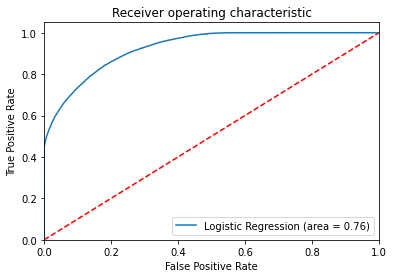

In [758]:
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

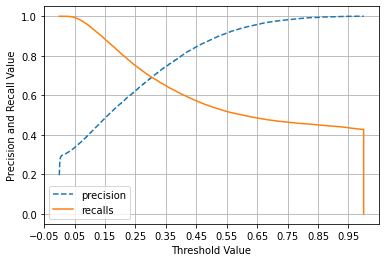

In [759]:
def precision_recall_curve_plot(y_test, pred_proba_c1):
    precisions, recalls, thresholds = precision_recall_curve(y_test, pred_proba_c1)
    
    threshold_boundary = thresholds.shape[0]
    # plot precision
    plt.plot(thresholds, precisions[0:threshold_boundary], linestyle='--', label='precision')
    # plot recall
    plt.plot(thresholds, recalls[0:threshold_boundary], label='recalls')
    
    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1), 2))
    
    plt.xlabel('Threshold Value'); plt.ylabel('Precision and Recall Value')
    plt.legend(); plt.grid()
    plt.show()
    
precision_recall_curve_plot(y_test, logreg.predict_proba(X_test)[:,1])


### Multicollinearity check using Variance Inﬂation Factor (VIF) -
Multicollinearity occurs when two or more independent variables are highly correlated with one another in a
regression model. Multicollinearity can be a problem in a regression model because we would not be able to
distinguish between the individual eﬀects of the independent variables on the dependent variable.

In [760]:
X 

,loan_amnt,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,issue_d,...,total_acc,mort_acc,pub_rec_bankruptcies,zipcode,verification_status_Source Verified,verification_status_Verified,application_type_INDIVIDUAL,application_type_JOINT,initial_list_status_w,term_60
0,10000.0,11.44,329.48,0.127292,0.138546,0.236111,0.197248,0.222136,117000.0,2015,...,25.0,0,0,0.193312,0,0,1,0,1,0
1,8000.0,11.99,265.68,0.127292,0.156762,0.316932,0.189832,0.169862,65000.0,2015,...,27.0,1,0,0.000000,0,0,1,0,0,0
2,15600.0,10.49,506.97,0.127292,0.126200,0.125064,0.205638,0.222136,43057.0,2015,...,26.0,0,0,0.000000,1,0,1,0,0,0
3,7200.0,6.49,220.65,0.063933,0.048100,0.195746,0.189065,0.222136,54000.0,2014,...,13.0,0,0,0.000000,0,0,1,0,0,0
4,24375.0,17.27,609.33,0.215211,0.250096,0.195746,0.201018,0.169862,55000.0,2013,...,43.0,0,0,1.000000,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396024,6000.0,13.11,202.49,0.127292,0.138546,0.195746,0.189709,0.222136,64000.0,2013,...,9.0,0,0,0.000000,0,0,1,0,1,0
396025,10000.0,10.99,217.38,0.127292,0.138546,0.195746,0.191800,0.222136,40000.0,2015,...,23.0,0,0,0.194122,1,0,1,0,1,1
396027,5000.0,9.99,161.32,0.127292,0.098732,0.285714,0.197248,0.222136,56500.0,2013,...,23.0,0,0,0.195469,0,1,1,0,0,0
396028,21000.0,15.31,503.02,0.215211,0.202590,0.195746,0.197248,0.169862,64000.0,2012,...,20.0,1,0,0.000000,0,1,1,0,0,1


In [761]:
variance_inflation_factor(X.values, 1)

193.52133262587543

In [762]:
def calc_vif(X):
    # Calculating the VIF
    vif = pd.DataFrame()
    vif['Feature'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by='VIF', ascending = False)
    return vif

calc_vif(X)[:5]

,Feature,VIF
9,issue_d,108257.00
13,earliest_cr_line,96722.42
24,application_type_INDIVIDUAL,7754.73
6,emp_length,1935.70
0,loan_amnt,234.80


In [763]:
# Removing issue_d
X.drop(['issue_d'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
12,earliest_cr_line,8854.62
23,application_type_INDIVIDUAL,7215.37
6,emp_length,1866.60
0,loan_amnt,234.79
2,installment,212.38


In [764]:
# Removing earliest_cr_line
X.drop(['earliest_cr_line'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
22,application_type_INDIVIDUAL,1673.57
6,emp_length,1556.35
0,loan_amnt,234.76
2,installment,212.36
1,int_rate,192.86


In [765]:
# Removing application_type_INDIVIDUAL
X.drop(['application_type_INDIVIDUAL'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
0,loan_amnt,234.64
2,installment,212.27
6,emp_length,198.27
1,int_rate,190.07
4,sub_grade,175.33


In [766]:
# Removing int_rate
X.drop(['int_rate'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
0,loan_amnt,227.79
1,installment,205.53
5,emp_length,175.35
3,sub_grade,106.23
2,grade,104.34


In [767]:
# Removing loan_amnt
X.drop(['loan_amnt'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
4,emp_length,174.92
1,grade,104.33
2,sub_grade,104.07
7,purpose,86.68
5,home_ownership,79.26


In [768]:
# Removing emp_length
X.drop(['emp_length'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
1,grade,104.18
2,sub_grade,103.76
6,purpose,61.12
4,home_ownership,44.22
7,title,17.53


In [769]:
# Removing grade
X.drop(['grade'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
5,purpose,61.08
3,home_ownership,44.17
6,title,17.53
8,open_acc,13.98
12,total_acc,12.43


In [770]:
# Removing purpose
X.drop(['purpose'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
3,home_ownership,24.88
5,title,14.85
7,open_acc,13.92
11,total_acc,12.39
4,annual_inc,9.29


In [771]:
# Removing home_ownership
X.drop(['home_ownership'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
6,open_acc,13.59
10,total_acc,12.32
4,title,11.53
3,annual_inc,8.70
9,revol_util,8.10


In [772]:
# Removing open_acc
X.drop(['open_acc'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
4,title,11.33
3,annual_inc,8.55
9,total_acc,8.20
8,revol_util,7.71
1,sub_grade,7.29


In [773]:
# Removing title
X.drop(['title'], axis = 1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
8,total_acc,7.96
3,annual_inc,7.94
7,revol_util,7.54
1,sub_grade,6.97
4,dti,6.86


In [783]:
X.shape

(334720, 17)

In [775]:
X = scaler.fit_transform(X)

kfold = KFold(n_splits=5)
accuracy = np.mean(cross_val_score(logreg, X, y, cv=kfold, scoring='accuracy', n_jobs=-1))
print("Cross Validation accuracy: {:.3f}".format(accuracy))

Cross Validation accuracy: 0.896


### Oversampling using SMOTE

In [776]:
sm = SMOTE(random_state=42)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())

In [777]:
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

After OverSampling, the shape of train_X: (376880, 28)
After OverSampling, the shape of train_y: (376880,) 

After OverSampling, counts of label '1': 188440
After OverSampling, counts of label '0': 188440


In [778]:
lr1 = LogisticRegression(max_iter=1000)
lr1.fit(X_train_res, y_train_res)
predictions = lr1.predict(X_test)
  
# Classification Report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.95      0.84      0.89     80760
           1       0.55      0.82      0.66     19656

    accuracy                           0.83    100416
   macro avg       0.75      0.83      0.77    100416
weighted avg       0.87      0.83      0.84    100416



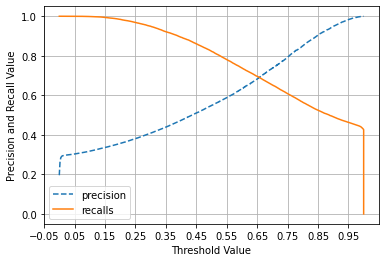

In [779]:
def precision_recall_curve_plot(y_test, pred_proba_c1):
    precisions, recalls, thresholds = precision_recall_curve(y_test, pred_proba_c1)
    
    threshold_boundary = thresholds.shape[0]
    # plot precision
    plt.plot(thresholds, precisions[0:threshold_boundary], linestyle='--', label='precision')
    # plot recall
    plt.plot(thresholds, recalls[0:threshold_boundary], label='recalls')
    
    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1), 2))
    
    plt.xlabel('Threshold Value'); plt.ylabel('Precision and Recall Value')
    plt.legend(); plt.grid()
    plt.show()
    
precision_recall_curve_plot(y_test, lr1.predict_proba(X_test)[:,1])

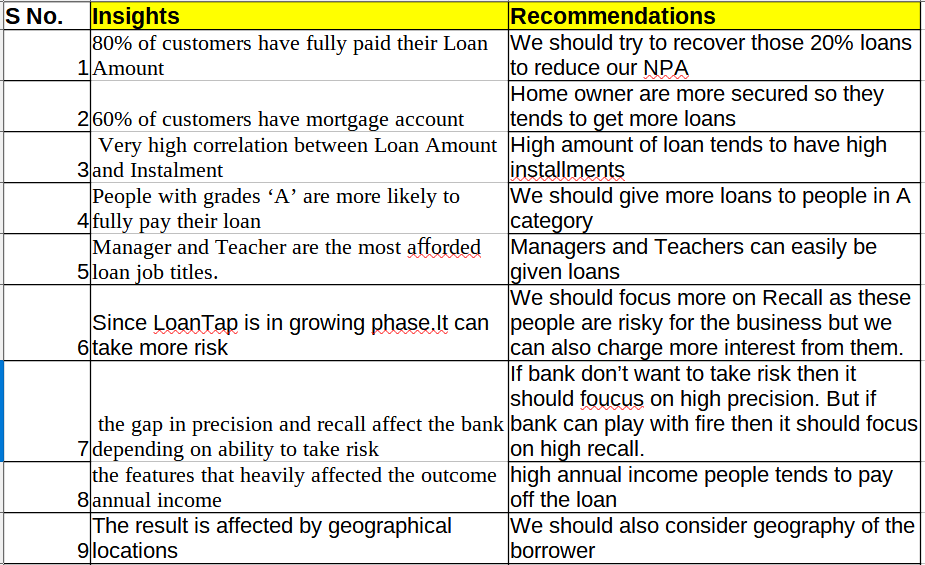

NameError: name 'image' is not defined